# Credit Approval Prediction dataset

CONTEXT

Credit score cards are a common risk control method in the financial industry. It uses personal information and data submitted by credit card applicants to predict the probability of future defaults and credit card borrowings. The bank is able to decide whether to issue a credit card to the applicant. Credit scores can objectively quantify the magnitude of risk.
 
Generally speaking, credit score cards are based on historical data. Once encountering large economic fluctuations. Past models may lose their original predictive power. Logistic model is a common method for credit scoring. Because Logistic is suitable for binary classification tasks and can calculate the coefficients of each feature. In order to facilitate understanding and operation, the score card will multiply the logistic regression coefficient by a certain value (such as 100) and round it.
 
At present, with the development of machine learning algorithms. More predictive methods such as Boosting, Random Forest, and Support Vector Machines have been introduced into credit card scoring. However, these methods often do not have good transparency. It may be difficult to provide customers and regulators with a reason for rejection or acceptance.

TASK

Build a machine learning model to predict if an applicant is 'good' or 'bad' client, different from other tasks, the definition of 'good' or 'bad' is not given. You should use some techique, such as vintage analysis to construct you label. Also, unbalance data problem is a big problem in this task.

Team Members

Tharoon Kumar Viswanathan– 001585510
Lokesh Balaji Parameswaran – 001562875
Krishna Ravichandran - 001001577

# Importing the Required libraries the CSV file

In [266]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
from sklearn.metrics import r2_score,accuracy_score,f1_score,precision_score,recall_score,confusion_matrix
from sklearn.metrics import mean_squared_error
!pip install pydotplus
!pip install graphviz

In [267]:
%pwd

'D:\\Information system\\Sem 1\\Info 6105\\Final Project'

In [268]:
path = 'D:\\Information system\\Sem 1\\Info 6105\\Final Project'

In [269]:
# Reading the Application.csv and Credit.csv file
df_app = pd.read_csv(f'{path}\\application_record.csv')
credit= pd.read_csv(f'{path}\\credit_record.csv')

In [270]:
print(df_app.shape)
df_app.head(2)

(438557, 18)


,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0


In [271]:
print(credit.shape)
credit.head(10)

(1048575, 3)


,ID,MONTHS_BALANCE,STATUS
0,5001711,0,X
1,5001711,-1,0
2,5001711,-2,0
3,5001711,-3,0
4,5001712,0,C
5,5001712,-1,C
6,5001712,-2,C
7,5001712,-3,C
8,5001712,-4,C
9,5001712,-5,C


In [272]:
df_app.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 438557 entries, 0 to 438556
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   ID                   438557 non-null  int64  
 1   CODE_GENDER          438557 non-null  object 
 2   FLAG_OWN_CAR         438557 non-null  object 
 3   FLAG_OWN_REALTY      438557 non-null  object 
 4   CNT_CHILDREN         438557 non-null  int64  
 5   AMT_INCOME_TOTAL     438557 non-null  float64
 6   NAME_INCOME_TYPE     438557 non-null  object 
 7   NAME_EDUCATION_TYPE  438557 non-null  object 
 8   NAME_FAMILY_STATUS   438557 non-null  object 
 9   NAME_HOUSING_TYPE    438557 non-null  object 
 10  DAYS_BIRTH           438557 non-null  int64  
 11  DAYS_EMPLOYED        438557 non-null  int64  
 12  FLAG_MOBIL           438557 non-null  int64  
 13  FLAG_WORK_PHONE      438557 non-null  int64  
 14  FLAG_PHONE           438557 non-null  int64  
 15  FLAG_EMAIL       

In [273]:
credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 3 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   ID              1048575 non-null  int64 
 1   MONTHS_BALANCE  1048575 non-null  int64 
 2   STATUS          1048575 non-null  object
dtypes: int64(2), object(1)
memory usage: 24.0+ MB


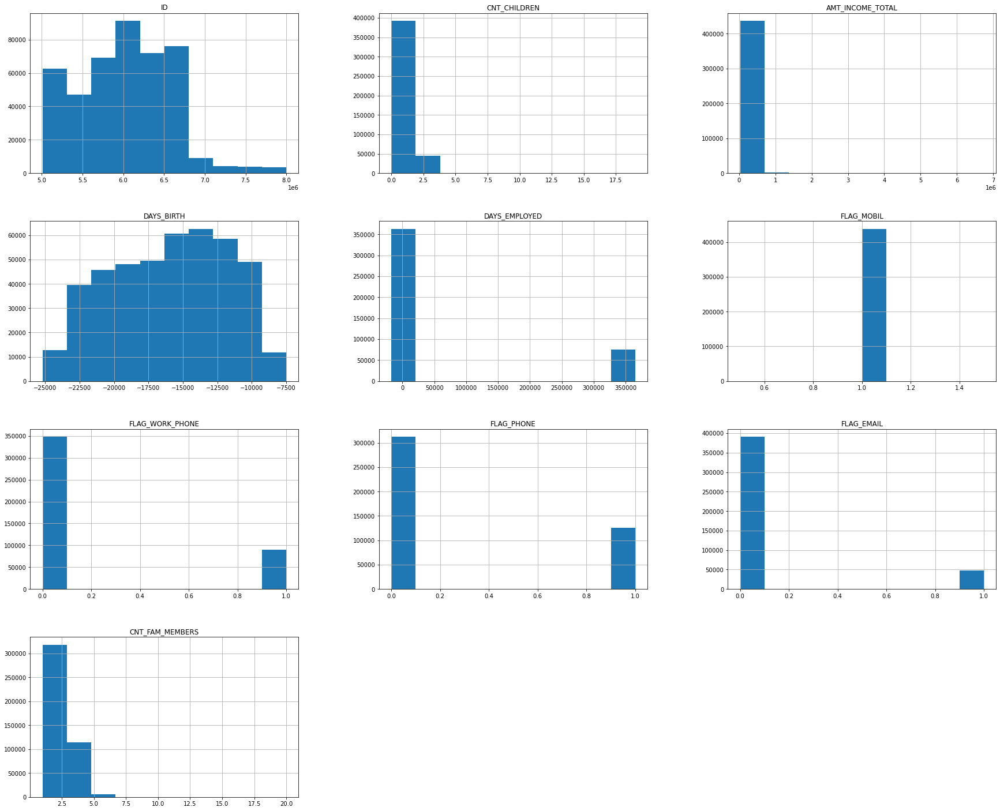

In [274]:
#Visuvalization of Application data set features using histogram
df_app.hist(figsize=(30,25))
plt.show()

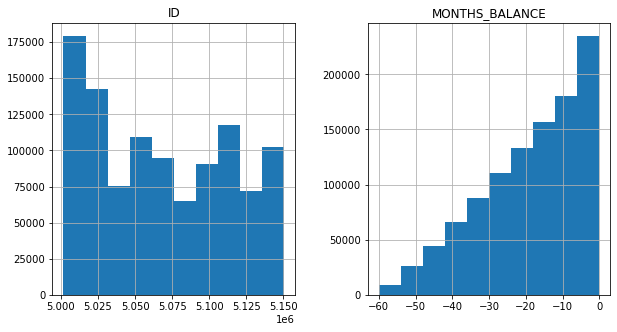

In [275]:
#Visuvalization of Credit data set features using histogram
credit.hist(figsize=(10,5))
plt.show()

<AxesSubplot:xlabel='Feature', ylabel='Percent missing'>

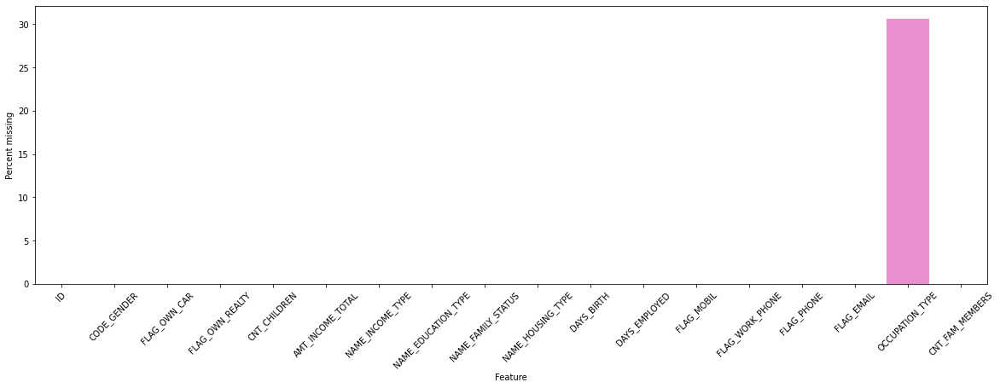

In [276]:
''' Deal with missing values. First, calculate the percentage of
missing values for every column, and plot them as a bar chart'''

null_vals = df_app.isnull().sum()/len(df_app)*100
null_vals = pd.DataFrame(null_vals)
null_vals.reset_index(inplace = True)
null_vals.columns = ["Feature","Percent missing"]
plt.figure(figsize = (20,6))
plt.xticks(rotation=45)
sns.barplot(x = "Feature",y ="Percent missing",data = null_vals)

In [277]:
#Dropping the Occupation filed as it consist higher percentage of NULL values
df_app2 = df_app.drop("OCCUPATION_TYPE",axis = 1)
print(df_app2.shape)
df_app2.head(2)

(438557, 17)


,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,2.0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,2.0


In [278]:
#Checking for null values in Credit record
credit.isnull().sum()


ID                0
MONTHS_BALANCE    0
STATUS            0
dtype: int64

# Pre Processing of data

# Filtering the Unique Values and Dropping Duplicates

In [279]:
#  Df_application  Id is a unique number , check for unique values in the ID column
df_app['ID'].nunique() 
# total number of unique values in 438510 and the total values in teh ID columns is 438557

438510

In [280]:
# Df_credit Id is a unique number , check for unique values in the ID column
credit['ID'].nunique() 
# total number of unique values in 45985 and the total values in teh ID columns is 1048575

45985

In [281]:
# checking to see how many records match in two datasets
len(set(credit['ID']).intersection(set(df_app['ID'])))

36457

In [282]:
df_app2 = df_app2.drop_duplicates('ID', keep='last') 

In [283]:
print(len(df_app2))

438510


# Converting Non-Numerical values (Object data type) to numerical values

In [284]:
# we have transformed all the non numeric data columns into data columns
# this method applies 0,1.. classification to different value types.
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for x in df_app2:
    if df_app2[x].dtypes=='object':
        df_app2[x] = le.fit_transform(df_app2[x])

In [285]:
df_app2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 438510 entries, 0 to 438556
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   ID                   438510 non-null  int64  
 1   CODE_GENDER          438510 non-null  int32  
 2   FLAG_OWN_CAR         438510 non-null  int32  
 3   FLAG_OWN_REALTY      438510 non-null  int32  
 4   CNT_CHILDREN         438510 non-null  int64  
 5   AMT_INCOME_TOTAL     438510 non-null  float64
 6   NAME_INCOME_TYPE     438510 non-null  int32  
 7   NAME_EDUCATION_TYPE  438510 non-null  int32  
 8   NAME_FAMILY_STATUS   438510 non-null  int32  
 9   NAME_HOUSING_TYPE    438510 non-null  int32  
 10  DAYS_BIRTH           438510 non-null  int64  
 11  DAYS_EMPLOYED        438510 non-null  int64  
 12  FLAG_MOBIL           438510 non-null  int64  
 13  FLAG_WORK_PHONE      438510 non-null  int64  
 14  FLAG_PHONE           438510 non-null  int64  
 15  FLAG_EMAIL       

In [286]:
df_app.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0


# Converting negative values for Feature Engineering

In [287]:
# Since negavtive values cannot be used in model DAYS_BIRTH is multiplied by -1
df_app['DAYS_BIRTH']=df_app['DAYS_BIRTH']*-1

In [288]:
# Since negavtive values cannot be used in model DAYS_EMPLOYED is multiplied by -1
df_app['DAYS_EMPLOYED']=df_app['DAYS_EMPLOYED']*-1

In [289]:
credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 3 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   ID              1048575 non-null  int64 
 1   MONTHS_BALANCE  1048575 non-null  int64 
 2   STATUS          1048575 non-null  object
dtypes: int64(2), object(1)
memory usage: 24.0+ MB


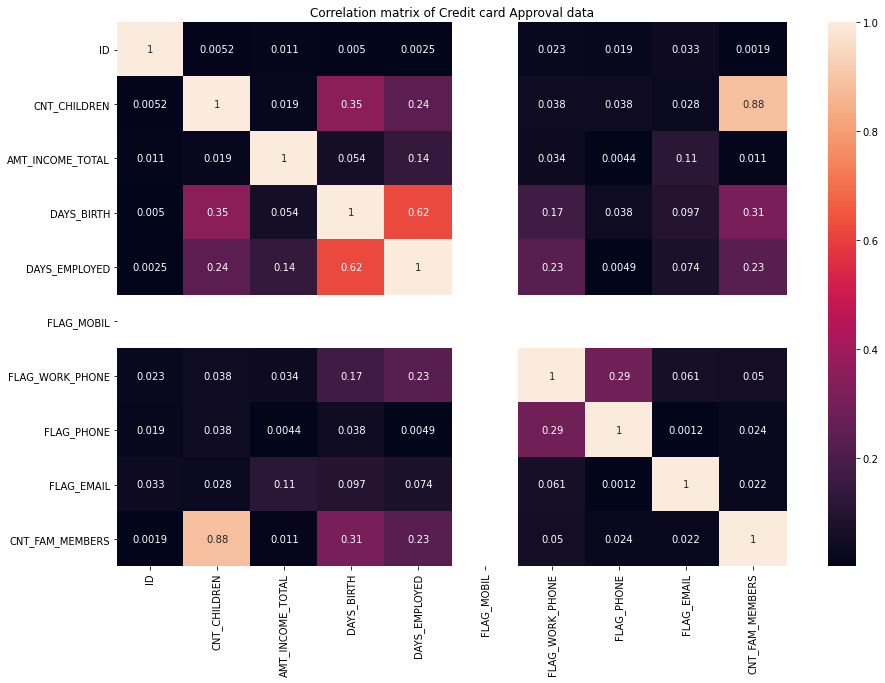

In [290]:
# correlation matix to find out the important features
plt.figure(figsize=(15,10))
plt.title("Correlation matrix of Credit card Approval data")
sns.heatmap(df_app.corr().abs(), annot=True)
plt.show()

In [291]:
# replace the value C and X with 0 as it is the same type
# 1,2,3,4,5 are classified as 1 because they are the same type
# these will be our labels/prediction results for our model
defaulter_codes= ['0','1','2','3','4','5']

In [292]:
credit['Status'] = np.where(credit.STATUS.isin(defaulter_codes), 1, 0)

In [293]:
credit.head(20)

,ID,MONTHS_BALANCE,STATUS,Status
0,5001711,0,X,0
1,5001711,-1,0,1
2,5001711,-2,0,1
3,5001711,-3,0,1
4,5001712,0,C,0
5,5001712,-1,C,0
6,5001712,-2,C,0
7,5001712,-3,C,0
8,5001712,-4,C,0
9,5001712,-5,C,0


In [294]:
# we calculated months from today column to see how much old is the month
# we also sort the data according to ID and Months from today columns. 
credit['Months from today'] = credit['MONTHS_BALANCE']*-1
credit = credit.sort_values(['ID','Months from today'], ascending=True)
credit

,ID,MONTHS_BALANCE,STATUS,Status,Months from today
0,5001711,0,X,0,0
1,5001711,-1,0,1,1
2,5001711,-2,0,1,2
3,5001711,-3,0,1,3
4,5001712,0,C,0,0
...,...,...,...,...,...
1048570,5150487,-25,C,0,25
1048571,5150487,-26,C,0,26
1048572,5150487,-27,C,0,27
1048573,5150487,-28,C,0,28


In [295]:
#we are grouping the data in crecord by ID so that we can join it with app
credit = credit.groupby('ID').agg(max).reset_index()
credit.head()

,ID,MONTHS_BALANCE,STATUS,Status,Months from today
0,5001711,0,X,1,3
1,5001712,0,C,1,18
2,5001713,0,X,0,21
3,5001714,0,X,0,14
4,5001715,0,X,0,59


In [296]:
credit2 = credit.drop("STATUS",axis = 1)
credit2 = credit2.drop("MONTHS_BALANCE",axis = 1)
print(credit2.shape)
credit2.head(2)

(45985, 3)


,ID,Status,Months from today
0,5001711,1,3
1,5001712,1,18


In [297]:
credit2['Status'].value_counts()

1    40032
0     5953
Name: Status, dtype: int64

# Joining the dataset

In [298]:
df = df_app2.join(credit2.set_index('ID'), on='ID', how='inner')

In [299]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36457 entries, 0 to 434812
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   36457 non-null  int64  
 1   CODE_GENDER          36457 non-null  int32  
 2   FLAG_OWN_CAR         36457 non-null  int32  
 3   FLAG_OWN_REALTY      36457 non-null  int32  
 4   CNT_CHILDREN         36457 non-null  int64  
 5   AMT_INCOME_TOTAL     36457 non-null  float64
 6   NAME_INCOME_TYPE     36457 non-null  int32  
 7   NAME_EDUCATION_TYPE  36457 non-null  int32  
 8   NAME_FAMILY_STATUS   36457 non-null  int32  
 9   NAME_HOUSING_TYPE    36457 non-null  int32  
 10  DAYS_BIRTH           36457 non-null  int64  
 11  DAYS_EMPLOYED        36457 non-null  int64  
 12  FLAG_MOBIL           36457 non-null  int64  
 13  FLAG_WORK_PHONE      36457 non-null  int64  
 14  FLAG_PHONE           36457 non-null  int64  
 15  FLAG_EMAIL           36457 non-null

In [300]:
df

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,Status,Months from today
0,5008804,1,1,1,0,427500.0,4,1,0,4,-12005,-4542,1,1,0,0,2.0,1,15
1,5008805,1,1,1,0,427500.0,4,1,0,4,-12005,-4542,1,1,0,0,2.0,1,14
2,5008806,1,1,1,0,112500.0,4,4,1,1,-21474,-1134,1,0,0,0,2.0,1,29
3,5008808,0,0,1,0,270000.0,0,4,3,1,-19110,-3051,1,0,1,1,1.0,1,4
4,5008809,0,0,1,0,270000.0,0,4,3,1,-19110,-3051,1,0,1,1,1.0,0,26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
434808,5149828,1,1,1,0,315000.0,4,4,1,1,-17348,-2420,1,0,0,0,2.0,1,11
434809,5149834,0,0,1,0,157500.0,0,1,1,1,-12387,-1325,1,0,1,1,2.0,1,23
434810,5149838,0,0,1,0,157500.0,1,1,1,1,-12387,-1325,1,0,1,1,2.0,1,32
434811,5150049,0,0,1,0,283500.0,4,4,1,1,-17958,-655,1,0,0,0,2.0,1,9


# Spliting the data set , oversampling , fitting the model and calculating the metrics

In [301]:
X = df.drop('Status', axis=1)
y = df['Status']
print(X.shape)
print(y.shape)

(36457, 18)
(36457,)


In [302]:
X.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,Months from today
0,5008804,1,1,1,0,427500.0,4,1,0,4,-12005,-4542,1,1,0,0,2.0,15
1,5008805,1,1,1,0,427500.0,4,1,0,4,-12005,-4542,1,1,0,0,2.0,14
2,5008806,1,1,1,0,112500.0,4,4,1,1,-21474,-1134,1,0,0,0,2.0,29
3,5008808,0,0,1,0,270000.0,0,4,3,1,-19110,-3051,1,0,1,1,1.0,4
4,5008809,0,0,1,0,270000.0,0,4,3,1,-19110,-3051,1,0,1,1,1.0,26


In [303]:
#Split dataset
from sklearn.model_selection import train_test_split,RepeatedStratifiedKFold,cross_val_score
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.30,random_state=1)

In [304]:
print(X_train.shape,X_test.shape,y_train.shape,y_test.shape)

(25519, 18) (10938, 18) (25519,) (10938,)


# Random forest model

In [305]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators = 150, random_state = 1551)

rf.fit(X_train,y_train)

rf_pred = rf.predict(X_test)

In [306]:
def CalculationOfMetric(y_test, prediction):
    
    precision_metric = metrics.precision_score(y_test, prediction, average = "macro")
    recall_metric = metrics.recall_score(y_test, prediction, average = "macro")
    accuracy_metric = metrics.accuracy_score (y_test, prediction)
    f1_metric = metrics.f1_score(y_test, prediction, average = "macro")
    
    print('Precision metric:',round(precision_metric, 4))
    print('Recall Metric:',round(recall_metric, 4))
    print('Accuracy Metric:',round(accuracy_metric, 4))
    print('F1 score:',round(f1_metric, 4))

In [307]:
CalculationOfMetric(y_test, rf_pred)

Precision metric: 0.71
Recall Metric: 0.6172
Accuracy Metric: 0.8801
F1 score: 0.6439


In [308]:
print(metrics.confusion_matrix(y_test, rf_pred))

[[ 359  973]
 [ 338 9268]]


<AxesSubplot:>

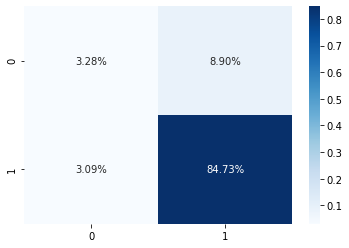

In [309]:
cf_matrix = confusion_matrix(y_test,rf_pred)
cf_matrix

sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, 
            fmt='.2%', cmap='Blues')

In [310]:
df.columns

Index(['ID', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'FLAG_MOBIL', 'FLAG_WORK_PHONE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'Status', 'Months from today'],
      dtype='object')

Feature Importance

<AxesSubplot:xlabel='Importance Score', ylabel='Feature'>

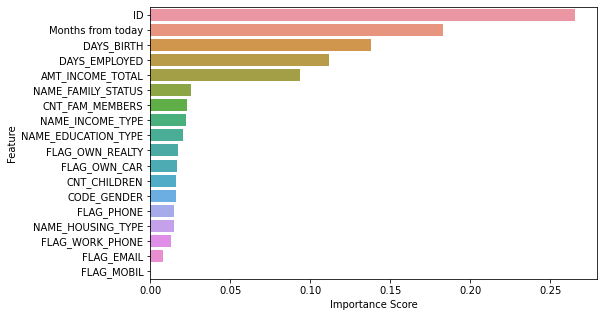

In [311]:
# After training the data set feature importance is calculated 
'''Calculate feature importance scores with your model'''

feat_imps = pd.DataFrame(rf.feature_importances_, index = X_train.columns,
                                    columns=['Importance score']).sort_values('Importance score',ascending=False)
feat_imps = feat_imps.reset_index()
feat_imps.columns = ["Feature","Importance Score"]
plt.figure(figsize = (8,5))
sns.barplot(x = "Importance Score",y = "Feature",data = feat_imps,orient = "h")


In [312]:
''' From the feature importance scores a new data frame is formed to calculate the accuracy on the validation dataset'''

df_3 = df[['ID', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'DAYS_BIRTH',
       'DAYS_EMPLOYED','CNT_FAM_MEMBERS', 'Status', 'Months from today']]

In [313]:
df_3.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,DAYS_BIRTH,DAYS_EMPLOYED,CNT_FAM_MEMBERS,Status,Months from today
0,5008804,1,1,1,0,427500.0,4,1,0,-12005,-4542,2.0,1,15
1,5008805,1,1,1,0,427500.0,4,1,0,-12005,-4542,2.0,1,14
2,5008806,1,1,1,0,112500.0,4,4,1,-21474,-1134,2.0,1,29
3,5008808,0,0,1,0,270000.0,0,4,3,-19110,-3051,1.0,1,4
4,5008809,0,0,1,0,270000.0,0,4,3,-19110,-3051,1.0,0,26


In [314]:
#Status is the Target variable
x_feat_imp = df_3.drop('Status', axis=1)
y_feat_imp = df_3['Status']
print(x_feat_imp.shape)
print(y_feat_imp.shape)

(36457, 13)
(36457,)


In [315]:
X_train1,X_test1,y_train1,y_test1=train_test_split(x_feat_imp,y_feat_imp,test_size=0.30,random_state=1)

In [316]:
#Training random forest classifier using feature importance
model_1 = RandomForestClassifier(n_estimators = 150, random_state = 1551)
model_1.fit(X_train1,y_train1)

RandomForestClassifier(n_estimators=150, random_state=1551)

In [317]:
y_val_pred_1 = model_1.predict(X_test1)

In [318]:
CalculationOfMetric(y_test1, y_val_pred_1)

Precision metric: 0.7154
Recall Metric: 0.6163
Accuracy Metric: 0.8814
F1 score: 0.6439


In [319]:
print(metrics.confusion_matrix(y_test1, y_val_pred_1))

[[ 354  978]
 [ 319 9287]]


<AxesSubplot:>

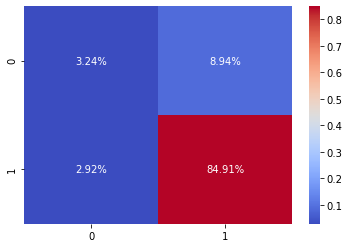

In [320]:
cf_matrix = confusion_matrix(y_test1,y_val_pred_1)
cf_matrix

sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, 
            fmt='.2%', cmap='coolwarm')

# K Nearest Neighbour Classifier

In [321]:
from sklearn.neighbors import KNeighborsClassifier

my_knn_model = KNeighborsClassifier(n_neighbors = 5,weights = 'uniform')

my_knn_model.fit(X_train,y_train)

Knn_pred = my_knn_model.predict(X_test)

In [322]:
CalculationOfMetric(y_test, Knn_pred)

Precision metric: 0.6738
Recall Metric: 0.5903
Accuracy Metric: 0.8722
F1 score: 0.6115


In [323]:
cf_matrix = print(metrics.confusion_matrix(y_test, Knn_pred))

[[ 290 1042]
 [ 356 9250]]


<AxesSubplot:>

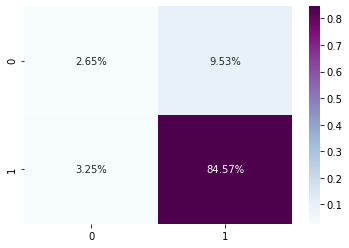

In [324]:
# from sklearn.metrics import confusion_matrix

cf_matrix = confusion_matrix(y_test,Knn_pred)
cf_matrix

sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, 
            fmt='.2%', cmap='BuPu')

# K Nearest Neighbour Classifier with HyperParameter Tuning

In [325]:
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

k_range = range(1, 15)
weight_options = ['uniform', 'distance']
metric_options= ['euclidean']
algorithm_options= ['auto']
param_dist = dict(n_neighbors=k_range, weights=weight_options,metric=metric_options,algorithm=algorithm_options)

rand = RandomizedSearchCV(KNeighborsClassifier(), param_dist, cv=10, scoring='accuracy', n_iter=20, random_state=10)

rand.fit(X_train,y_train)

RandomizedSearchCV(cv=10, estimator=KNeighborsClassifier(), n_iter=20,
                   param_distributions={'algorithm': ['auto'],
                                        'metric': ['euclidean'],
                                        'n_neighbors': range(1, 15),
                                        'weights': ['uniform', 'distance']},
                   random_state=10, scoring='accuracy')

In [326]:
accuracy = print(rand.best_score_)
print(rand.best_params_)
print(rand.best_estimator_)

0.875190717513201
{'weights': 'distance', 'n_neighbors': 14, 'metric': 'euclidean', 'algorithm': 'auto'}
KNeighborsClassifier(metric='euclidean', n_neighbors=14, weights='distance')


In [327]:
#Finding the results of the model
rand_pd=pd.DataFrame(rand.cv_results_)
rand_pd.head(5)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_weights,param_n_neighbors,param_metric,param_algorithm,params,split0_test_score,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,0.019429,0.036345,1.269949,0.043949,distance,4,euclidean,auto,"{'weights': 'distance', 'n_neighbors': 4, 'met...",0.861285,...,0.862069,0.874608,0.860110,0.866379,0.867163,0.861677,0.858879,0.865551,0.006493,14
1,0.007478,0.000667,1.263921,0.028802,distance,11,euclidean,auto,"{'weights': 'distance', 'n_neighbors': 11, 'me...",0.869906,...,0.873041,0.880878,0.869122,0.876959,0.876567,0.871865,0.865935,0.874250,0.005749,5
2,0.007477,0.000495,0.982979,0.024348,distance,3,euclidean,auto,"{'weights': 'distance', 'n_neighbors': 3, 'met...",0.859326,...,0.855799,0.872649,0.857759,0.864420,0.867163,0.857759,0.859663,0.863082,0.005939,15
3,0.006481,0.000667,0.948263,0.010693,uniform,2,euclidean,auto,"{'weights': 'uniform', 'n_neighbors': 2, 'metr...",0.794279,...,0.798981,0.810345,0.787226,0.810737,0.821708,0.804859,0.802430,0.805870,0.011048,20
4,0.007483,0.000667,1.295089,0.077425,distance,7,euclidean,auto,"{'weights': 'distance', 'n_neighbors': 7, 'met...",0.869122,...,0.871473,0.878135,0.865596,0.875000,0.874608,0.869906,0.863975,0.872213,0.005461,9


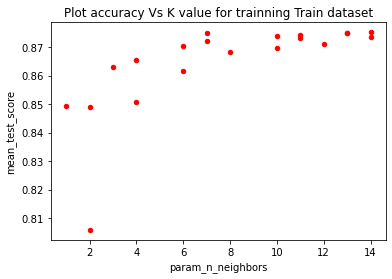

In [328]:
#Plot accuracy Vs trainning set accuracy of the model

import matplotlib.pyplot as plt
import pandas as pd

ax = plt.gca()

#rand_pd_1.plot(kind='line',x='param_n_neighbors',y='num_children',ax=ax)
rand_pd.plot(kind='scatter',x='param_n_neighbors',y='mean_test_score', color='red', ax=ax,
             title='Plot accuracy Vs K value for trainning Train dataset')

plt.show()

In [329]:
#Implementing the tunned hyper parameters 

my_knn_model = KNeighborsClassifier(n_neighbors = 14,weights = 'uniform',metric='euclidean',algorithm='auto')
my_knn_model.fit(X_train,y_train)
Knn_pred_HP = my_knn_model.predict(X_test)

In [330]:
CalculationOfMetric(y_test, Knn_pred_HP)

Precision metric: 0.6216
Recall Metric: 0.5277
Accuracy Metric: 0.8712
F1 score: 0.5263


In [331]:
print(metrics.confusion_matrix(y_test, Knn_pred_HP))

[[  98 1234]
 [ 175 9431]]


<AxesSubplot:>

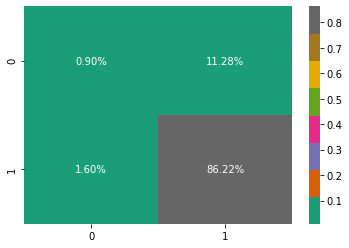

In [332]:
cf_matrix = confusion_matrix(y_test,Knn_pred_HP)
cf_matrix

sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, 
            fmt='.2%', cmap='Dark2')

# Decision Tree Classifier

In [333]:
from sklearn.tree import DecisionTreeClassifier
FEATURE_NAMES=X.columns
DesTree = DecisionTreeClassifier()
DesTree.fit(X_train,y_train)
DesTree_pred=DesTree.predict(X_test)

In [334]:
CalculationOfMetric(y_test, DesTree_pred)

Precision metric: 0.622
Recall Metric: 0.6346
Accuracy Metric: 0.8324
F1 score: 0.6277


In [335]:
print(metrics.confusion_matrix(y_test, DesTree_pred))

[[ 497  835]
 [ 998 8608]]


<AxesSubplot:>

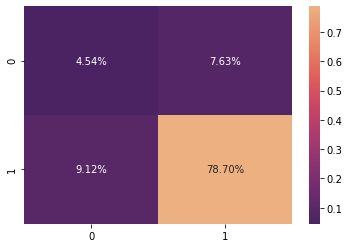

In [336]:
cf_matrix = confusion_matrix(y_test,DesTree_pred)
cf_matrix

sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, 
            fmt='.2%', cmap='flare_r')

# Printing the decision tree

In [337]:
from sklearn import datasets
from sklearn.tree import DecisionTreeClassifier 
from sklearn import tree
import graphviz
dot_data = tree.export_graphviz(DesTree, out_file=None, 
                                feature_names=FEATURE_NAMES, 
                                class_names=['N','Y'],
                                filled=True)

graph = graphviz.Source(dot_data, format="png") 
graph

In [338]:
from sklearn.tree import export_graphviz
from six import StringIO  
import pydotplus

dot_data = StringIO()
export_graphviz(DesTree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = FEATURE_NAMES,class_names=['N','Y'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('my_decision_tree.png')

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.18949 to fit



True

# XG Boost Algorithim 

In [339]:
# Using SMOTE to solve the over sampling issue
from imblearn.over_sampling import SMOTE
oversample = SMOTE()

In [340]:
from imblearn.pipeline import Pipeline

In [341]:
# XG Boost Classifier
from sklearn.model_selection import train_test_split,RepeatedStratifiedKFold,cross_val_score
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.30,random_state=1)

from xgboost import XGBClassifier
xgb = XGBClassifier()

In [342]:
# using pipeline to implement the SMOTE and XG Boost classifier model
pipeline = Pipeline(steps=[('r',oversample),('m',xgb)])
pipeline.fit(X_train,y_train)

# Using Repeated k-fold cross-validation provides a way to improve the estimated performance of a machine learning model.
cv=RepeatedStratifiedKFold(n_splits=10,n_repeats=3,random_state=1)
scores=cross_val_score(pipeline,X_test,y_test,scoring='roc_auc',cv=cv,n_jobs=-1)


C:\Users\Tharoon\Anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:19:42] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [343]:
xgb_pred = pipeline.predict(X_test)

In [344]:
CalculationOfMetric(y_test, xgb_pred)

Precision metric: 0.6275
Recall Metric: 0.6158
Accuracy Metric: 0.8453
F1 score: 0.6211


In [345]:
print(metrics.confusion_matrix(y_test, xgb_pred))

[[ 416  916]
 [ 776 8830]]


<AxesSubplot:>

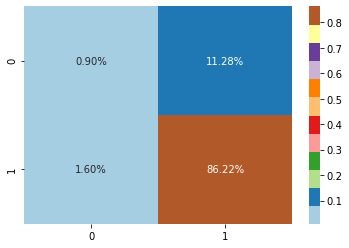

In [346]:
cf_matrix = confusion_matrix(y_test,Knn_pred_HP)
cf_matrix

sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, 
            fmt='.2%', cmap='Paired')

In [347]:
# ROC curve
ROC_score=scores.mean()
ROC_score

0.6437493280719397

In [348]:
from sklearn.metrics import classification_report,roc_curve,roc_auc_score
scores = classification_report(y_test,rf_pred)
rec, fall_out, thresholds = roc_curve(y_test,rf_pred)

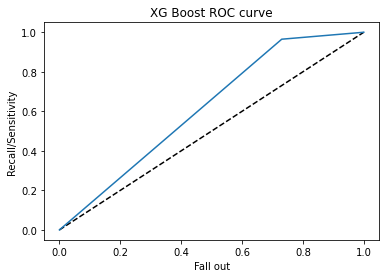

In [349]:
plt.plot([0,1],[0,1],'k--')
plt.plot(rec,fall_out, label='XG Boost')
plt.xlabel('Fall out')
plt.ylabel('Recall/Sensitivity')
plt.title('XG Boost ROC curve')
plt.show()

In [350]:
X.shape

(36457, 18)

# DNN Model using Keras

In [351]:
from keras.models import Sequential
from keras.layers import Dense
DL_model = Sequential()
DL_model.add(Dense(14, kernel_initializer="glorot_uniform",input_dim=18, activation='relu'))
DL_model.add(Dense(6, kernel_initializer="random_normal",activation='relu'))
DL_model.add(Dense(1, kernel_initializer="glorot_uniform",activation='sigmoid'))

In [352]:
DL_model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [353]:
DL_model_gr= DL_model.fit(X_train, y_train,  epochs=100, batch_size=5)

Epoch 1/100
5104/5104 [==============================] - 5s 877us/step - loss: 1916.3992 - accuracy: 0.7919
Epoch 2/100
5104/5104 [==============================] - 4s 878us/step - loss: 113.1518 - accuracy: 0.7872
Epoch 3/100
5104/5104 [==============================] - 4s 877us/step - loss: 71.2555 - accuracy: 0.7830
Epoch 4/100
5104/5104 [==============================] - 4s 871us/step - loss: 32.5758 - accuracy: 0.7880
Epoch 5/100
5104/5104 [==============================] - 5s 886us/step - loss: 0.5538 - accuracy: 0.8407
Epoch 6/100
5104/5104 [==============================] - 5s 898us/step - loss: 0.3658 - accuracy: 0.8812
Epoch 7/100
5104/5104 [==============================] - 5s 885us/step - loss: 0.3681 - accuracy: 0.8794
Epoch 8/100
5104/5104 [==============================] - 5s 886us/step - loss: 0.3727 - accuracy: 0.8771
Epoch 9/100
5104/5104 [==============================] - 5s 887us/step - loss: 0.3758 - accuracy: 0.8756
Epoch 10/100
5104/5104 [========================

In [354]:
y_pred = DL_model.predict(X_test)

In [355]:
y_pred = (y_pred > 0.5)

In [356]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
cm

array([[   0, 1332],
       [   0, 9606]], dtype=int64)

<AxesSubplot:>

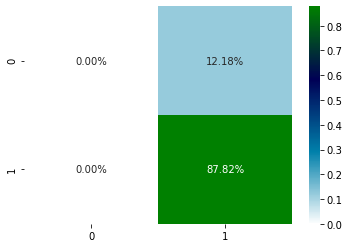

In [357]:
sns.heatmap(cm/np.sum(cf_matrix), annot=True, 
            fmt='.2%', cmap='ocean_r')

In [358]:
CalculationOfMetric(y_test, y_pred)

Precision metric: 0.4391
Recall Metric: 0.5
Accuracy Metric: 0.8782
F1 score: 0.4676


C:\Users\Tharoon\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [359]:
# Evaluate the model
scores = DL_model.evaluate(X_test, y_test)
DNN_Accuracy=print ("Accuracy: %.2f%%" %(scores[1]))

342/342 [==============================] - 0s 672us/step - loss: 0.3705 - accuracy: 0.8782
Accuracy: 0.88%


# Result Metrics

In [360]:
print("*******************************************")
print("XG Boost classification metrics with SMOTE")
CalculationOfMetric(y_test, xgb_pred)
print("*******************************************")
print("Random forest metrics")
CalculationOfMetric(y_test, rf_pred)
print("*******************************************")
print("Desicion tree metrics")
CalculationOfMetric(y_test, DesTree_pred)
print("*******************************************")
print("K Nearest Neighbours metrics")
CalculationOfMetric(y_test, Knn_pred)
print("*******************************************")
print("K Nearest Neighbours metrics after hyper parameter turning metrics")
CalculationOfMetric(y_test, Knn_pred_HP)
print("*******************************************")
print("Deep Neural Network metrics")
CalculationOfMetric(y_test, y_pred)
print("*******************************************")

*******************************************
XG Boost classification metrics with SMOTE
Precision metric: 0.6275
Recall Metric: 0.6158
Accuracy Metric: 0.8453
F1 score: 0.6211
*******************************************
Random forest metrics
Precision metric: 0.71
Recall Metric: 0.6172
Accuracy Metric: 0.8801
F1 score: 0.6439
*******************************************
Desicion tree metrics
Precision metric: 0.622
Recall Metric: 0.6346
Accuracy Metric: 0.8324
F1 score: 0.6277
*******************************************
K Nearest Neighbours metrics
Precision metric: 0.6738
Recall Metric: 0.5903
Accuracy Metric: 0.8722
F1 score: 0.6115
*******************************************
K Nearest Neighbours metrics after hyper parameter turning metrics
Precision metric: 0.6216
Recall Metric: 0.5277
Accuracy Metric: 0.8712
F1 score: 0.5263
*******************************************
Deep Neural Network metrics
Precision metric: 0.4391
Recall Metric: 0.5
Accuracy Metric: 0.8782
F1 score: 0.4676
***

C:\Users\Tharoon\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


maximum accuracy is 0.8801426220515634


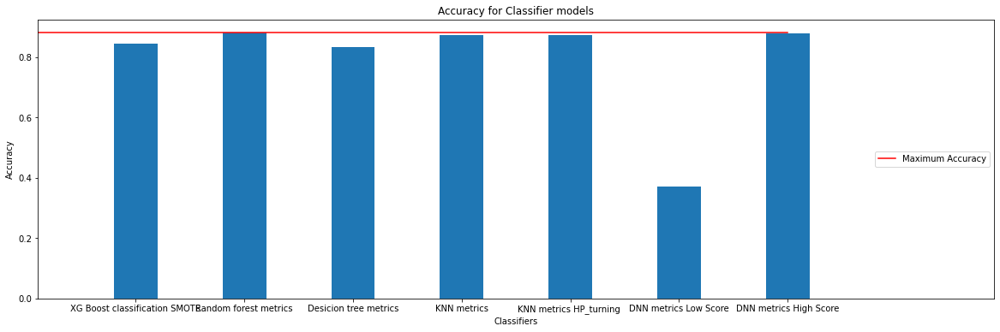

In [361]:
accuracy_scores= {'XG Boost classification SMOTE': metrics.accuracy_score(y_test, xgb_pred),
                  'Random forest metrics': metrics.accuracy_score(y_test, rf_pred), 
                  'Desicion tree metrics': metrics.accuracy_score(y_test, DesTree_pred), 
                  'KNN metrics': metrics.accuracy_score(y_test, Knn_pred),
                  'KNN metrics HP_turning ': metrics.accuracy_score(y_test,Knn_pred_HP ),
                  'DNN metrics Low Score' : (scores[0]),
                  'DNN metrics High Score' : (scores[1])
                  }
classifiers = accuracy_scores.keys()
accuracy = accuracy_scores.values()
plt.figure(figsize = (20, 6))
plt.bar(classifiers, accuracy, 0.4)
plt.plot(range(-1,7), np.ones(8)*max(accuracy), color = 'red', label = 'Maximum Accuracy')
plt.xlim(-0.9,7.9)
plt.xlabel('Classifiers')
plt.ylabel('Accuracy')
plt.legend(loc = 'right')
plt.title('Accuracy for Classifier models')
print("maximum accuracy is",max(accuracy))

maximum F1 score is 0.9351635514018691


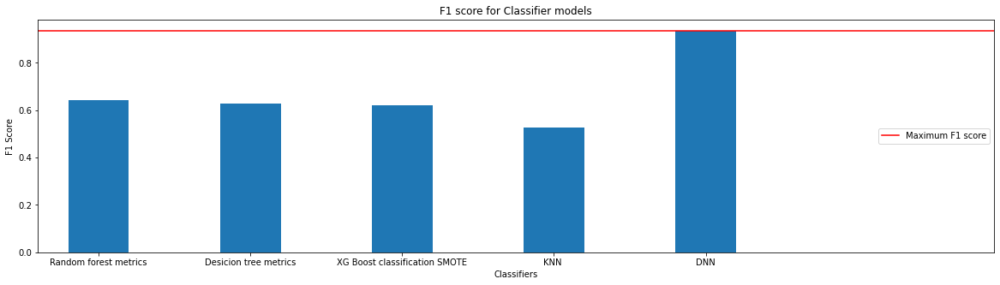

In [363]:
F1_scores= {
            'Random forest metrics': metrics.f1_score(y_test, rf_pred, average = "macro"),
            'Desicion tree metrics':  metrics.f1_score(y_test, DesTree_pred, average = "macro"),
          'XG Boost classification SMOTE': metrics.f1_score(y_test, xgb_pred, average = "macro"),
            'KNN ': metrics.f1_score(y_test, Knn_pred_HP, average = "macro"), 
            'DNN': DNN_f1_score
             }
classifiers = F1_scores.keys()
f1 = F1_scores.values() 
plt.figure(figsize = (20, 5))
plt.bar(classifiers, f1, 0.4)
plt.plot(range(-1,7), np.ones(8)*max(f1), color = 'red', label = 'Maximum F1 score')
plt.xlim(-0.4,5.9)
plt.xlabel('Classifiers')
plt.ylabel('F1 Score')
plt.legend(loc = 'right')
plt.title('F1 score for Classifier models')
print("maximum F1 score is",max(f1))